<a href="https://colab.research.google.com/github/Abhilash-Bee/MachineLearning_DeepLearning_Projects/blob/main/Regression/House_price_prediction_regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Description:

<img src=https://storage.googleapis.com/kaggle-media/competitions/House%20Prices/kaggle_5407_media_housesbanner.png>

 Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

 With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

## Getting House price data

In [ ]:
import zipfile

filepath = '/content/drive/MyDrive/Colab Notebooks/Machine Learning Projects/RegressionProjects/house-prices-advanced-regression-techniques.zip'

with zipfile.ZipFile(filepath, 'r') as file:
    file.extractall()

## Importing Dependencies

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data_dir = '/content/house-prices-advanced-regression-techniques/'

train_dir = data_dir + 'train.csv'
test_dir = data_dir + 'test.csv'

## Converting `.csv` to `pd.DataFrame()`

In [ ]:
train_data = pd.read_csv(train_dir)
test_data = pd.read_csv(test_dir)

In [ ]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


## Data Information

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Data Describe

In [ ]:
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


## Data Description

In [ ]:
data = None
with open(data_dir+'data_description.txt', 'r') as file:
    data = file.readlines()

for line in data:
    if line != '\n':
        print(line, end='')

MSSubClass: Identifies the type of dwelling involved in the sale.	
        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES
MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	R

In [ ]:
train_data['MSSubClass'] = train_data['MSSubClass'].apply(str)
test_data['MSSubClass'] = test_data['MSSubClass'].apply(str)
train_data['MSSubClass'].dtype, test_data['MSSubClass'].dtype

(dtype('O'), dtype('O'))

## Splitting the data into train data and validation data

In [ ]:
X, y = train_data.drop('SalePrice', axis=1), train_data['SalePrice']

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=8)

len(X_train), len(y_train), len(X_val), len(y_val)

(1314, 1314, 146, 146)

## Handling missing values

In [ ]:
print(len(X_train))
X_train.isnull().sum()[X_train.isnull().sum() > 0]

1314


LotFrontage      226
Alley           1227
MasVnrType         8
MasVnrArea         8
BsmtQual          33
BsmtCond          33
BsmtExposure      34
BsmtFinType1      33
BsmtFinType2      33
Electrical         1
FireplaceQu      631
GarageType        76
GarageYrBlt       76
GarageFinish      76
GarageQual        76
GarageCond        76
PoolQC          1307
Fence           1059
MiscFeature     1265
dtype: int64

In [ ]:
missing_columns = X_train.isnull().sum()[X_train.isnull().sum() > 0].index
missing_columns

Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

In [ ]:
missing_data = []

for col in missing_columns:
    data = X_train[col].isnull().sum()
    size = len(X_train)
    dictonary = {}
    dictonary['Column Name'] = col
    dictonary['Missing Percentage'] = (data / size) * 100
    dictonary['Non-missing Percentage'] = 100 - ((data / size) * 100)
    missing_data.append(dictonary)

missing_df = pd.DataFrame(missing_data)
missing_df

,Column Name,Missing Percentage,Non-missing Percentage
0,LotFrontage,17.199391,82.800609
1,Alley,93.378995,6.621005
2,MasVnrType,0.608828,99.391172
3,MasVnrArea,0.608828,99.391172
4,BsmtQual,2.511416,97.488584
5,BsmtCond,2.511416,97.488584
6,BsmtExposure,2.587519,97.412481
7,BsmtFinType1,2.511416,97.488584
8,BsmtFinType2,2.511416,97.488584
9,Electrical,0.076104,99.923896


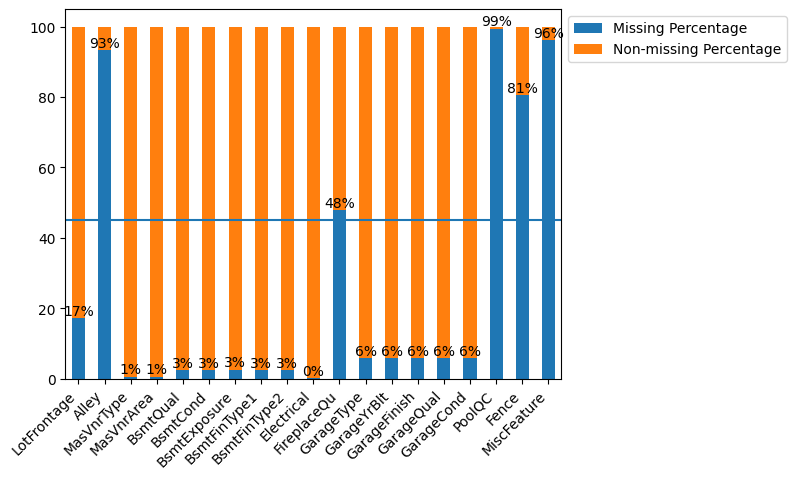

In [ ]:
ax = missing_df.plot(kind='bar', stacked=True)
ax.legend(bbox_to_anchor=(1, 1))
ax.set_xticklabels(missing_df['Column Name'].to_list(), rotation=45, ha='right')
ax.axhline(y=45)
ax.bar_label(ax.containers[0], fmt='%.0f%%');

**About Data:**
> Deleting all columns having missing values more than $45$%.

In [ ]:
cols = missing_df['Column Name'][missing_df['Missing Percentage'] > 45].to_list()
cols.append('Id')
X_train_df = X_train.drop(cols, axis=1)
X_val_df = X_val.drop(cols, axis=1)
test_df = test_data.drop(cols, axis=1)

In [ ]:
X_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1081,20,RL,75.0,7500,Pave,Reg,Lvl,AllPub,Corner,Gtl,...,0,220,0,0,0,0,6,2010,WD,Normal
837,160,RM,21.0,1680,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,11,2008,WD,Normal
1450,90,RL,60.0,9000,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,45,0,0,0,0,0,9,2009,WD,Normal
933,20,RL,63.0,8487,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,36,0,0,0,0,0,8,2009,WD,Normal
1399,50,RL,51.0,6171,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,16,0,0,0,0,0,10,2009,WD,Normal


In [ ]:
X_val_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1260,60,RL,NaN,24682,Pave,IR3,Lvl,AllPub,CulDSac,Gtl,...,103,0,0,0,0,0,6,2009,WD,Normal
274,20,RL,76.0,8314,Pave,Reg,Lvl,AllPub,Corner,Gtl,...,0,0,0,0,0,0,6,2007,WD,Normal
51,50,RM,52.0,6240,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,400,9,2006,WD,Normal
117,20,RL,74.0,8536,Pave,Reg,Lvl,AllPub,Corner,Gtl,...,64,0,0,0,0,0,4,2007,New,Partial
789,60,RL,NaN,12205,Pave,IR1,Low,AllPub,Inside,Gtl,...,168,0,0,0,0,0,7,2007,WD,Normal


In [ ]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,120,0,0,6,2010,WD,Normal
1,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,36,0,0,0,0,12500,6,2010,WD,Normal
2,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,34,0,0,0,0,0,3,2010,WD,Normal
3,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,36,0,0,0,0,0,6,2010,WD,Normal
4,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,...,82,0,0,144,0,0,1,2010,WD,Normal


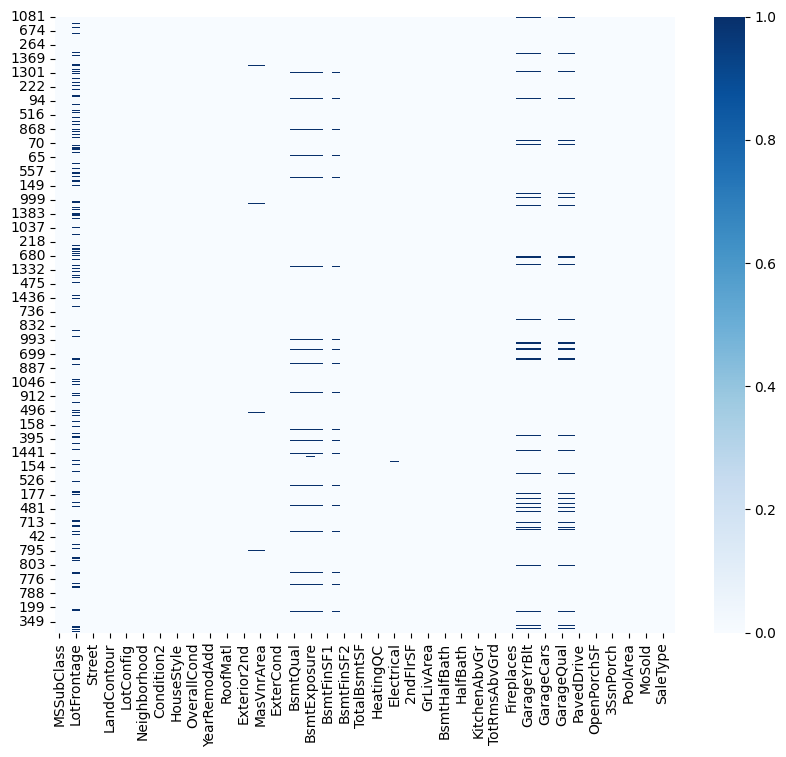

In [ ]:
fig = plt.figure(figsize=(10, 8))
sns.heatmap(X_train_df.isnull(), cmap=plt.cm.Blues);

In [ ]:
obj_cols = list(X_train_df.select_dtypes('object').columns)
obj_cols = X_train_df[obj_cols].isnull().sum()[X_train_df[obj_cols].isnull().sum() > 0].index
obj_cols

Index(['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Electrical', 'GarageType', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')

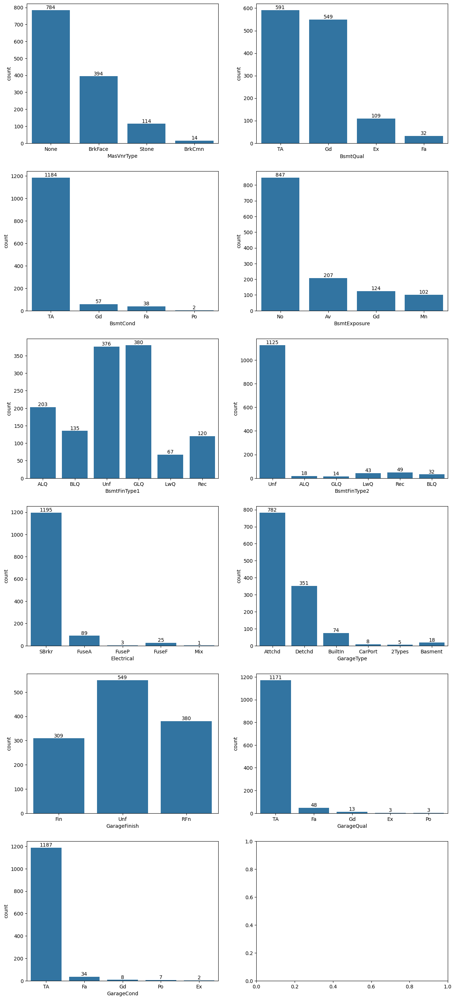

In [ ]:
fig, ax = plt.subplots(int(len(obj_cols)/2) + 1, 2, figsize=(15, 35))
ax = ax.flatten()
k = 0

for col in obj_cols:
    if X_train_df[col].isnull().sum() > 0:
        plot = sns.countplot(x=X_train_df[col], ax=ax[k])
        plot.bar_label(plot.containers[0])
        k += 1

**About Data:**
> By the above data it shows that we can use `most_frequent` to fill the categorical data.

### Selecting all `object` dtype columns and Imputing if any column has missing data using `SimpleImputer` and then converting into numeric encoding using `LabelEncoder`.

**Error:**
> Since there is a unseen data `ValueError: y contains previously unseen labels: 20`. Mapping the particular column manually.

In [ ]:
mssubclass = list(X_train_df['MSSubClass'].unique())
mssubclass

['20',
 '160',
 '90',
 '50',
 '60',
 '120',
 '70',
 '30',
 '80',
 '190',
 '85',
 '40',
 '75',
 '180',
 '45']

In [ ]:
mssubclassmap = {}

for i, key in enumerate(mssubclass):
    mssubclassmap[key] = i

mssubclassmap

{'20': 0,
 '160': 1,
 '90': 2,
 '50': 3,
 '60': 4,
 '120': 5,
 '70': 6,
 '30': 7,
 '80': 8,
 '190': 9,
 '85': 10,
 '40': 11,
 '75': 12,
 '180': 13,
 '45': 14}

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder

obj_cols = X_train_df.select_dtypes('object').columns

for col in obj_cols:
    imputer = SimpleImputer(strategy='most_frequent')
    imputer.fit(np.array(X_train_df[col]).reshape(-1, 1))
    im_train_data = imputer.transform(np.array(X_train_df[col]).reshape(-1, 1)).squeeze()
    im_val_data = imputer.transform(np.array(X_val_df[col]).reshape(-1, 1)).squeeze()
    im_test_data = imputer.transform(np.array(test_df[col]).reshape(-1, 1)).squeeze()

    if col != 'MSSubClass':
        encoder = LabelEncoder()
        encoder.fit(im_train_data)
        X_train_df[col] = encoder.transform(im_train_data)
        X_val_df[col] = encoder.transform(im_val_data)
        test_df[col] = encoder.transform(im_test_data)
    else:
        X_train_df[col] = pd.Series(im_train_data).map(mssubclassmap).values
        X_val_df[col] = pd.Series(im_val_data).map(mssubclassmap).values
        test_df[col] = pd.Series(im_test_data).map(mssubclassmap).values

In [ ]:
X_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1081,0,3,75.0,7500,1,3,3,0,0,0,...,0,220,0,0,0,0,6,2010,8,4
837,1,4,21.0,1680,1,3,3,0,4,0,...,0,0,0,0,0,0,11,2008,8,4
1450,2,3,60.0,9000,1,3,3,0,2,0,...,45,0,0,0,0,0,9,2009,8,4
933,0,3,63.0,8487,1,3,3,0,2,0,...,36,0,0,0,0,0,8,2009,8,4
1399,3,3,51.0,6171,1,3,3,0,4,0,...,16,0,0,0,0,0,10,2009,8,4


In [ ]:
X_val_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1260,4,3,NaN,24682,1,2,3,0,1,0,...,103,0,0,0,0,0,6,2009,8,4
274,0,3,76.0,8314,1,3,3,0,0,0,...,0,0,0,0,0,0,6,2007,8,4
51,3,4,52.0,6240,1,3,3,0,4,0,...,0,0,0,0,0,400,9,2006,8,4
117,0,3,74.0,8536,1,3,3,0,0,0,...,64,0,0,0,0,0,4,2007,6,5
789,4,3,NaN,12205,1,0,2,0,4,0,...,168,0,0,0,0,0,7,2007,8,4


In [ ]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.0,2,80.0,11622,1,3,3,0,4,0,...,0,0,0,120,0,0,6,2010,8,4
1,0.0,3,81.0,14267,1,0,3,0,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,4.0,3,74.0,13830,1,0,3,0,4,0,...,34,0,0,0,0,0,3,2010,8,4
3,4.0,3,78.0,9978,1,0,3,0,4,0,...,36,0,0,0,0,0,6,2010,8,4
4,5.0,3,43.0,5005,1,0,1,0,4,0,...,82,0,0,144,0,0,1,2010,8,4


### Now imputing rest of the numeric columns using `IterativeImputer`

In [ ]:
num_cols = list(X_train_df.select_dtypes(exclude='object').columns)

X_train_df[num_cols].isnull().sum()[X_train_df[num_cols].isnull().sum() > 0]

LotFrontage    226
MasVnrArea       8
GarageYrBlt     76
dtype: int64

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer = IterativeImputer()
imputer.fit(X_train_df)
X_train_df = pd.DataFrame(imputer.transform(X_train_df), columns=X_train_df.columns, index=X_train_df.index)
X_val_df = pd.DataFrame(imputer.transform(X_val_df), columns=X_val_df.columns, index=X_val_df.index)
test_df = pd.DataFrame(imputer.transform(test_df), columns=test_df.columns, index=test_df.index)

In [ ]:
num_cols = list(X_train_df.select_dtypes(exclude='object').columns)

X_train_df[num_cols].isnull().sum()[X_train_df[num_cols].isnull().sum() > 0]

Series([], dtype: int64)

In [ ]:
X_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1081,0.0,3.0,75.0,7500.0,1.0,3.0,3.0,0.0,0.0,0.0,...,0.0,220.0,0.0,0.0,0.0,0.0,6.0,2010.0,8.0,4.0
837,1.0,4.0,21.0,1680.0,1.0,3.0,3.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,11.0,2008.0,8.0,4.0
1450,2.0,3.0,60.0,9000.0,1.0,3.0,3.0,0.0,2.0,0.0,...,45.0,0.0,0.0,0.0,0.0,0.0,9.0,2009.0,8.0,4.0
933,0.0,3.0,63.0,8487.0,1.0,3.0,3.0,0.0,2.0,0.0,...,36.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,8.0,4.0
1399,3.0,3.0,51.0,6171.0,1.0,3.0,3.0,0.0,4.0,0.0,...,16.0,0.0,0.0,0.0,0.0,0.0,10.0,2009.0,8.0,4.0


In [ ]:
X_val_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1260,4.0,3.0,81.200802,24682.0,1.0,2.0,3.0,0.0,1.0,0.0,...,103.0,0.0,0.0,0.0,0.0,0.0,6.0,2009.0,8.0,4.0
274,0.0,3.0,76.000000,8314.0,1.0,3.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2007.0,8.0,4.0
51,3.0,4.0,52.000000,6240.0,1.0,3.0,3.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,400.0,9.0,2006.0,8.0,4.0
117,0.0,3.0,74.000000,8536.0,1.0,3.0,3.0,0.0,0.0,0.0,...,64.0,0.0,0.0,0.0,0.0,0.0,4.0,2007.0,6.0,5.0
789,4.0,3.0,76.998036,12205.0,1.0,0.0,2.0,0.0,4.0,0.0,...,168.0,0.0,0.0,0.0,0.0,0.0,7.0,2007.0,8.0,4.0


In [ ]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.0,2.0,80.0,11622.0,1.0,3.0,3.0,0.0,4.0,0.0,...,0.0,0.0,0.0,120.0,0.0,0.0,6.0,2010.0,8.0,4.0
1,0.0,3.0,81.0,14267.0,1.0,0.0,3.0,0.0,0.0,0.0,...,36.0,0.0,0.0,0.0,0.0,12500.0,6.0,2010.0,8.0,4.0
2,4.0,3.0,74.0,13830.0,1.0,0.0,3.0,0.0,4.0,0.0,...,34.0,0.0,0.0,0.0,0.0,0.0,3.0,2010.0,8.0,4.0
3,4.0,3.0,78.0,9978.0,1.0,0.0,3.0,0.0,4.0,0.0,...,36.0,0.0,0.0,0.0,0.0,0.0,6.0,2010.0,8.0,4.0
4,5.0,3.0,43.0,5005.0,1.0,0.0,1.0,0.0,4.0,0.0,...,82.0,0.0,0.0,144.0,0.0,0.0,1.0,2010.0,8.0,4.0


## Checking Duplicates

In [ ]:
X_train_df.duplicated().sum(), X_val_df.duplicated().sum(), test_df.duplicated().sum()

(0, 0, 0)

## Correlation matrix using `heatmap`.

In [ ]:
data = pd.concat([X_train_df, y_train], axis=1)
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1081,0.0,3.0,75.0,7500.0,1.0,3.0,3.0,0.0,0.0,0.0,...,220.0,0.0,0.0,0.0,0.0,6.0,2010.0,8.0,4.0,133000
837,1.0,4.0,21.0,1680.0,1.0,3.0,3.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,2008.0,8.0,4.0,100000
1450,2.0,3.0,60.0,9000.0,1.0,3.0,3.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,9.0,2009.0,8.0,4.0,136000
933,0.0,3.0,63.0,8487.0,1.0,3.0,3.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,8.0,4.0,190000
1399,3.0,3.0,51.0,6171.0,1.0,3.0,3.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10.0,2009.0,8.0,4.0,137450


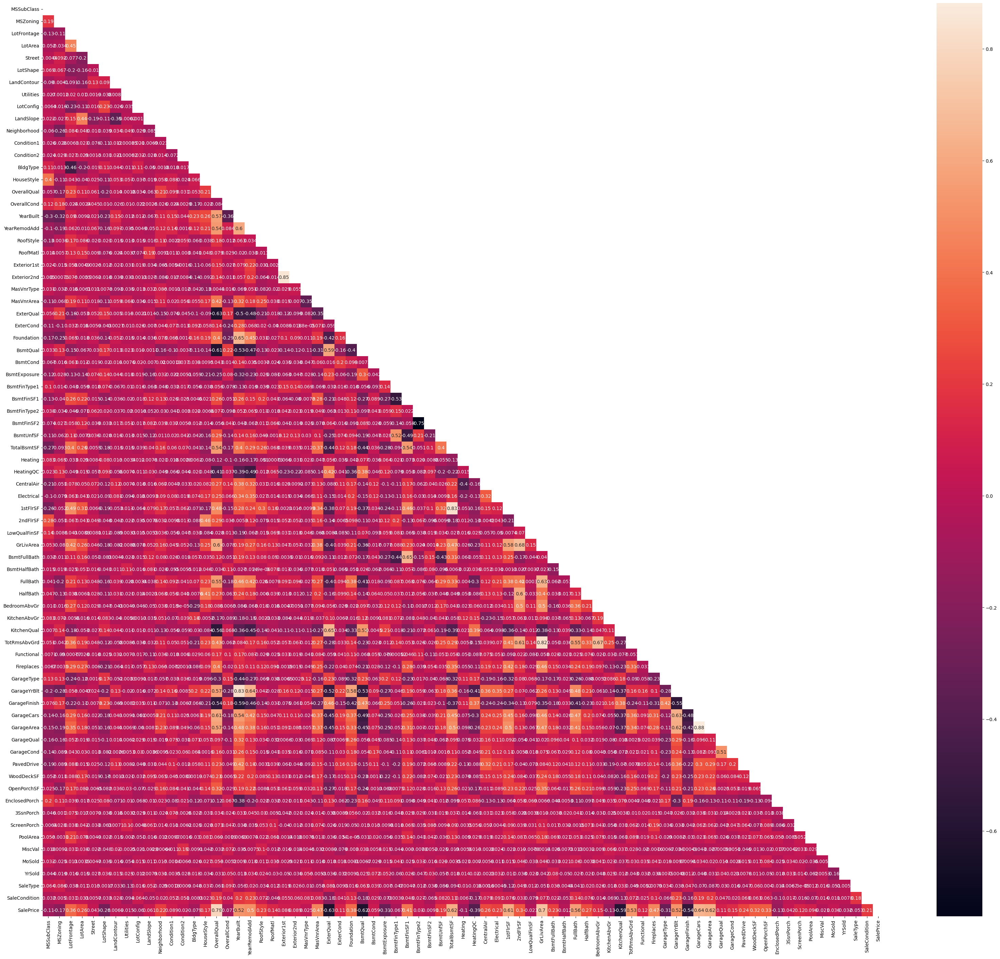

In [ ]:
fig = plt.figure(figsize=(40, 35))
corr = data.corr()
mask = np.triu(corr)
sns.heatmap(corr, mask=mask, annot=True);

In [ ]:
cols = corr.nlargest(25, 'SalePrice')['SalePrice'].index
cols

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
       'GarageYrBlt', 'YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1',
       'Foundation', 'LotFrontage', 'OpenPorchSF', 'WoodDeckSF', '2ndFlrSF',
       'HalfBath', 'LotArea', 'CentralAir', 'PavedDrive', 'Electrical'],
      dtype='object')

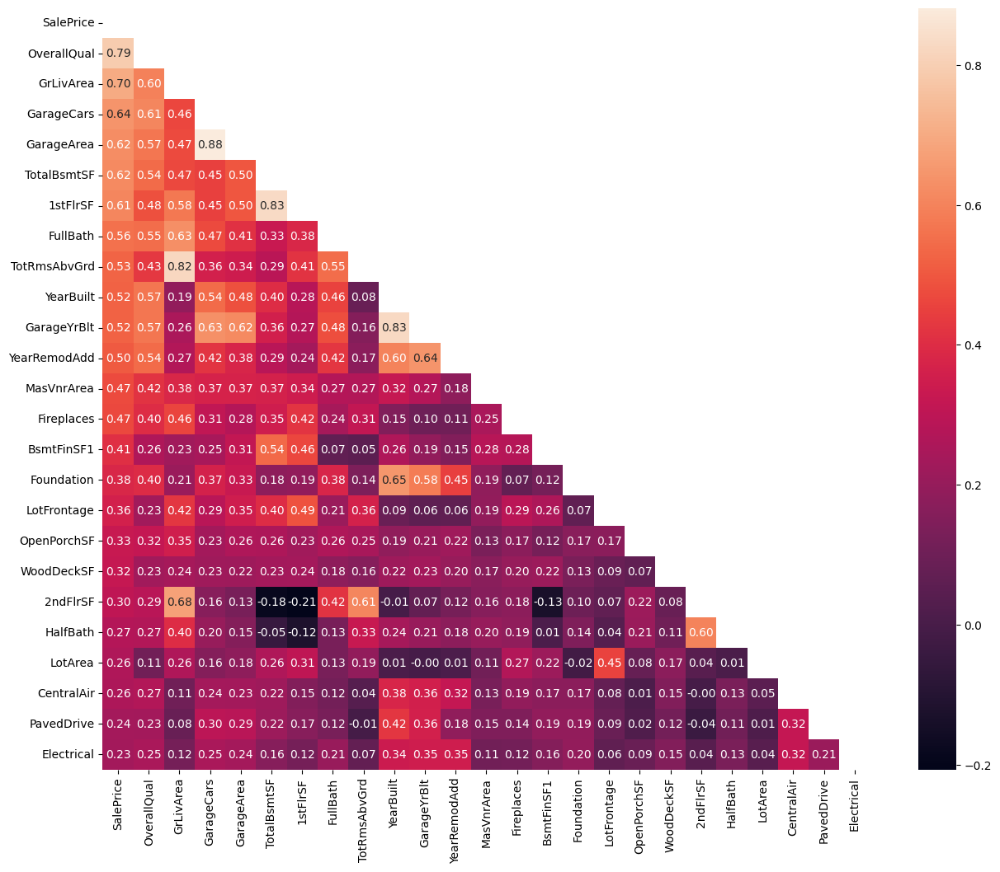

In [ ]:
fig = plt.figure(figsize=(15, 12))
corr1 = data[cols].corr()
mask = np.triu(corr1)
hm = sns.heatmap(corr1, annot=True, mask=mask, fmt='.2f')

## Handling Outliers

In [ ]:
data[cols].describe().T

,count,mean,std,min,25%,50%,75%,max
SalePrice,1314.0,180794.847793,80567.076102,34900.0,129925.00,162000.0,213187.500000,755000.0
OverallQual,1314.0,6.090563,1.391472,1.0,5.00,6.0,7.000000,10.0
GrLivArea,1314.0,1512.451294,526.425799,334.0,1130.25,1457.0,1774.000000,5642.0
GarageCars,1314.0,1.754186,0.747477,0.0,1.00,2.0,2.000000,4.0
GarageArea,1314.0,470.854642,215.153997,0.0,320.50,480.0,576.000000,1418.0
TotalBsmtSF,1314.0,1058.732877,442.399145,0.0,793.00,991.0,1304.000000,6110.0
1stFlrSF,1314.0,1165.086758,393.036350,334.0,874.00,1090.0,1392.000000,4692.0
FullBath,1314.0,1.557839,0.553397,0.0,1.00,2.0,2.000000,3.0
TotRmsAbvGrd,1314.0,6.490107,1.629968,2.0,5.00,6.0,7.000000,14.0
YearBuilt,1314.0,1970.803653,30.251967,1872.0,1953.00,1972.0,2000.000000,2010.0


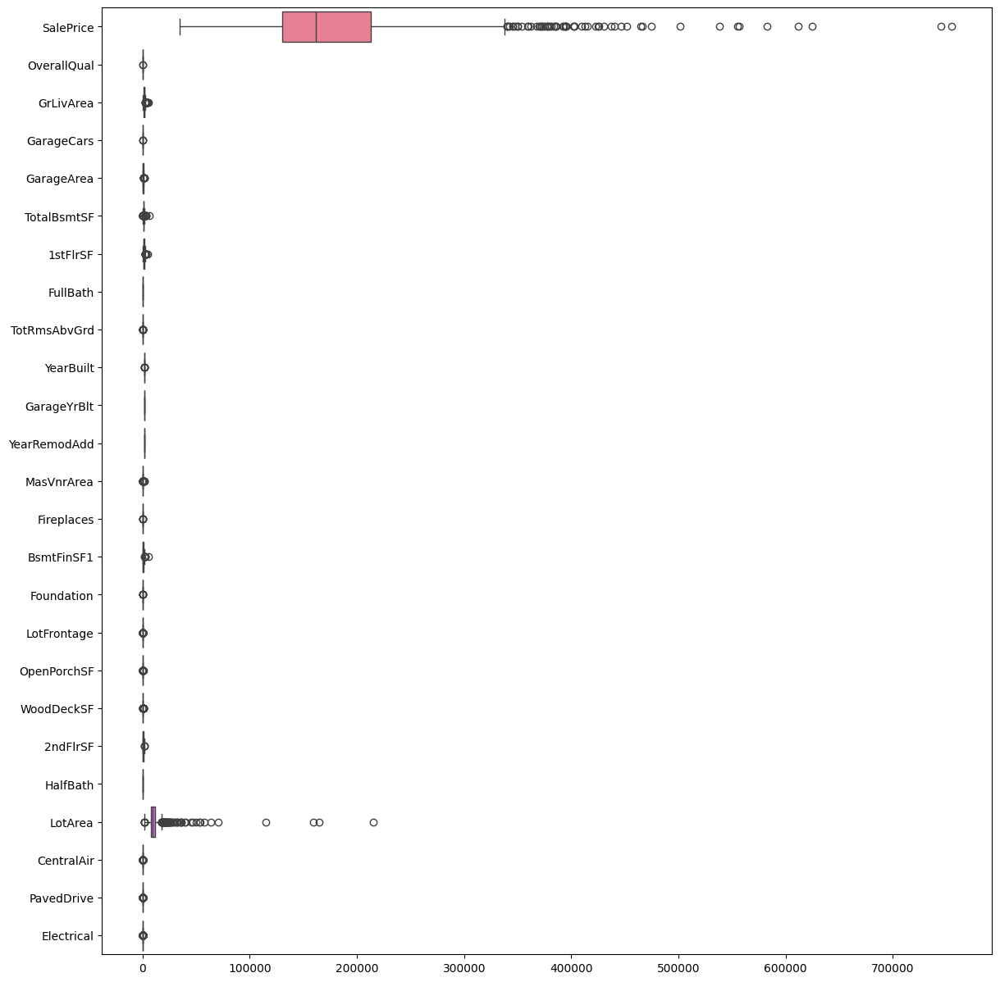

In [ ]:
fig = plt.figure(figsize=(14, 15))
sns.boxplot(data[cols], orient='h');

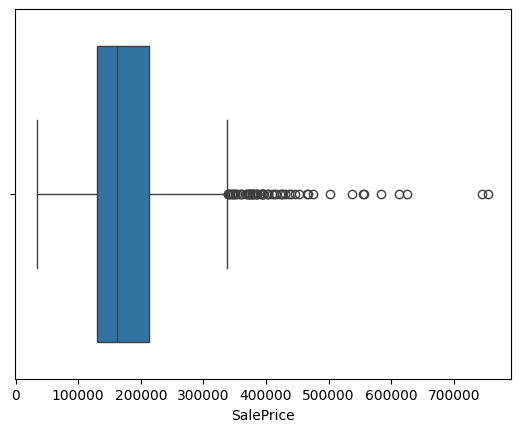

In [ ]:
sns.boxplot(data['SalePrice'], orient='h');

In [ ]:
X_train = data[cols].drop('SalePrice', axis=1)
X_val = X_val_df[cols.drop('SalePrice')]
test_df = test_df[cols.drop('SalePrice')]

In [ ]:
X_train_out = X_train.copy()
X_val_out = X_val.copy()
test_df_out = test_df.copy()

for col in X_train.columns:
    q1 = X_train[col].quantile(0.25)
    q3 = X_train[col].quantile(0.75)
    iqr = q3 - q1
    lr = q1 - 1.5 * iqr
    ur = q3 + 1.5 * iqr

    X_train_out[col] = np.where(X_train[col] < lr, lr, X_train[col])
    X_train_out[col] = np.where(X_train[col] > ur, ur, X_train[col])

    X_val_out[col] = np.where(X_val[col] < lr, lr, X_val[col])
    X_val_out[col] = np.where(X_val[col] > ur, ur, X_val[col])

    test_df_out[col] = np.where(test_df[col] < lr, lr, test_df[col])
    test_df_out[col] = np.where(test_df[col] > ur, ur, test_df[col])


col = 'SalePrice'
q1 = y_train.quantile(0.25)
q3 = y_train.quantile(0.75)
iqr = q3 - q1
lr = q1 - 1.5 * iqr
ur = q3 + 1.5 * iqr


y_train_out = pd.Series(np.where(y_train < lr, lr, y_train), index=y_train.index)
y_train_out = pd.Series(np.where(y_train > ur, ur, y_train), index=y_train.index)

y_val_out = pd.Series(np.where(y_val < lr, lr, y_val), index=y_val.index)
y_val_out = pd.Series(np.where(y_val > ur, ur, y_val), index=y_val.index)

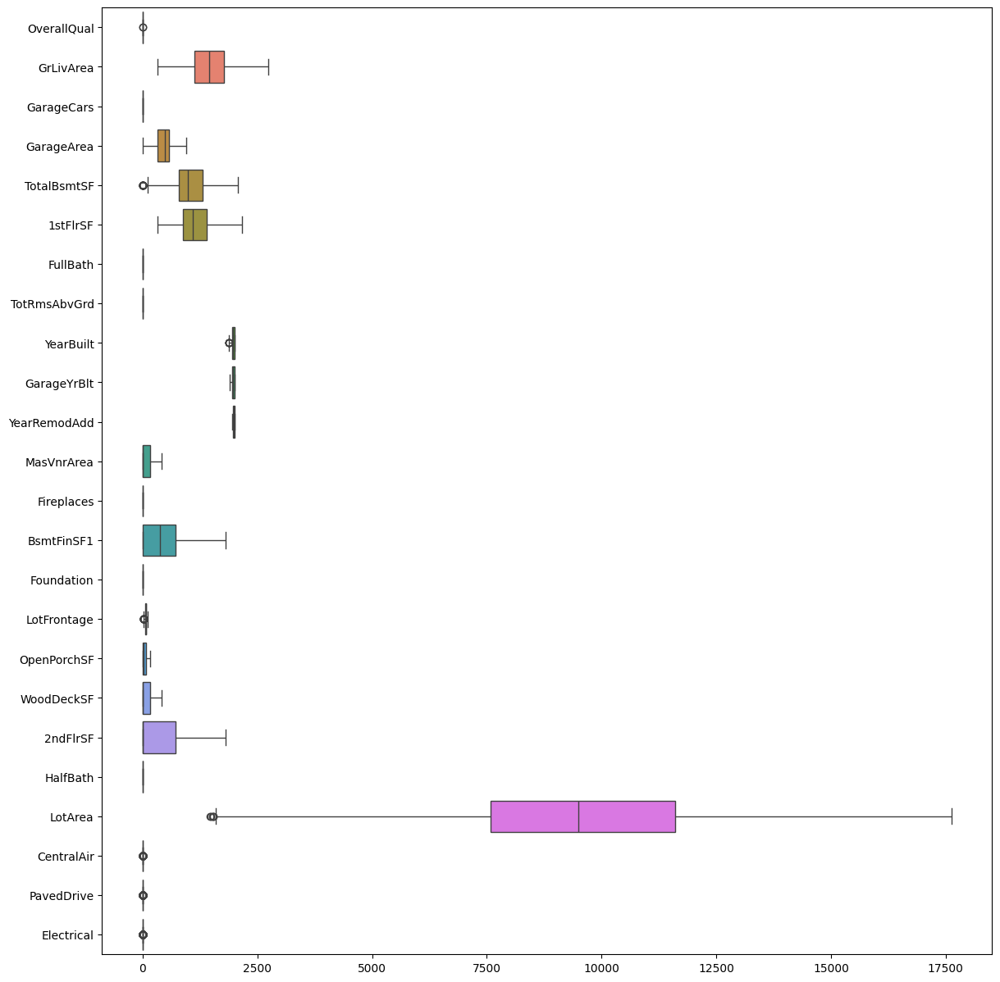

In [ ]:
fig = plt.figure(figsize=(14, 15))
sns.boxplot(X_train_out, orient='h');

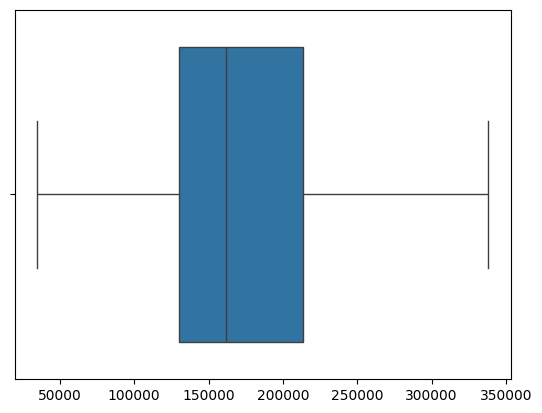

In [ ]:
sns.boxplot(y_train_out, orient='h');

**About Data:**
> According to the observation of the above data. I personally conclude that, I don't want to remove the outliers because the outliers may give some positive insights.

## EDA (Exploratory Data Analysis)

### Univariate Analysis

In [ ]:
data = pd.concat([X_train_out, y_train_out], axis=1)
data.rename(columns={0: 'SalePrice'}, inplace=True)
data.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,GarageYrBlt,...,LotFrontage,OpenPorchSF,WoodDeckSF,2ndFlrSF,HalfBath,LotArea,CentralAir,PavedDrive,Electrical,SalePrice
1081,5.0,1040.0,1.0,308.0,1040.0,1040.0,1.0,5.0,1963.0,1963.000000,...,75.0,0.0,0.0,0.0,1.0,7500.0,1.0,2.0,4.0,133000.0
837,6.0,987.0,1.0,264.0,483.0,483.0,1.0,5.0,1973.0,1973.000000,...,21.0,0.0,0.0,504.0,1.0,1680.0,1.0,2.0,4.0,100000.0
1450,5.0,1792.0,0.0,0.0,896.0,896.0,2.0,8.0,1974.0,1960.896708,...,60.0,45.0,32.0,896.0,2.0,9000.0,1.0,2.0,4.0,136000.0
933,7.0,1500.0,2.0,570.0,1500.0,1500.0,2.0,6.0,2004.0,2004.000000,...,63.0,36.0,192.0,0.0,0.0,8487.0,1.0,2.0,4.0,190000.0
1399,6.0,1608.0,1.0,216.0,976.0,1160.0,2.0,7.0,1925.0,1925.000000,...,51.0,16.0,147.0,448.0,1.0,6171.0,1.0,2.0,4.0,137450.0


In [ ]:
columns = np.array(data.columns)
columns = columns.reshape(len(columns) // 5, 5)
columns

array([['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
        'TotalBsmtSF'],
       ['1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
        'GarageYrBlt'],
       ['YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1',
        'Foundation'],
       ['LotFrontage', 'OpenPorchSF', 'WoodDeckSF', '2ndFlrSF',
        'HalfBath'],
       ['LotArea', 'CentralAir', 'PavedDrive', 'Electrical', 'SalePrice']],
      dtype=object)

#### Looking the distribution of each column

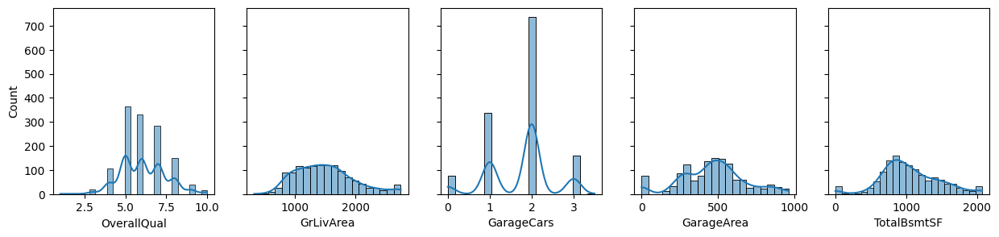

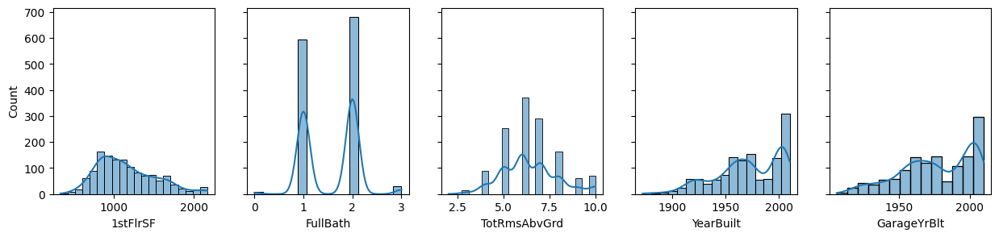

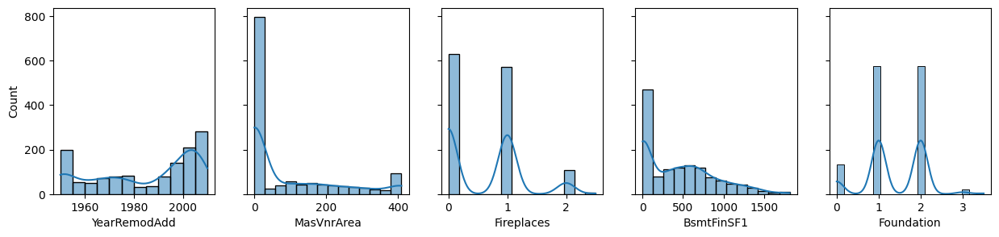

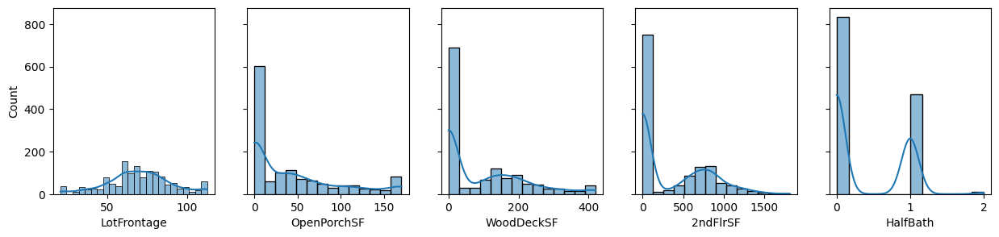

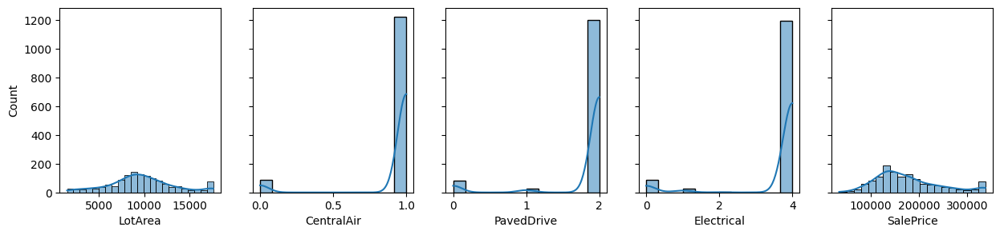

In [ ]:
for row in columns:
    fig, ax = plt.subplots(1, 5, figsize=(15, 3), sharey=True)
    for i, col in enumerate(row):
        plot = sns.histplot(data[col], ax=ax[i], kde=True)

**About Data:**
> According to the observation of the above data. Most of the data is kind of normal distribution.

### Bivariate/Multivariate Analysis

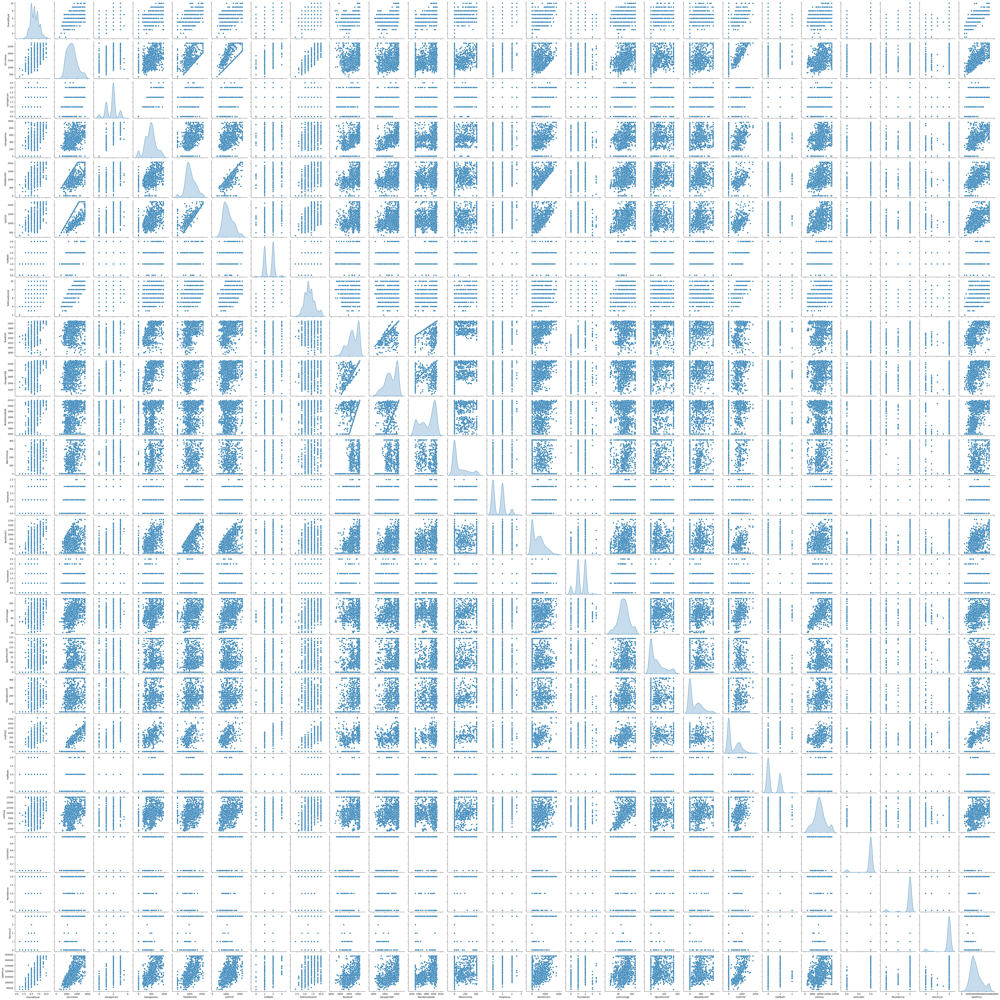

In [ ]:
sns.pairplot(data, diag_kind='kde');

#### On the above `heatmap` observation, plotting few plots to know more about the data.

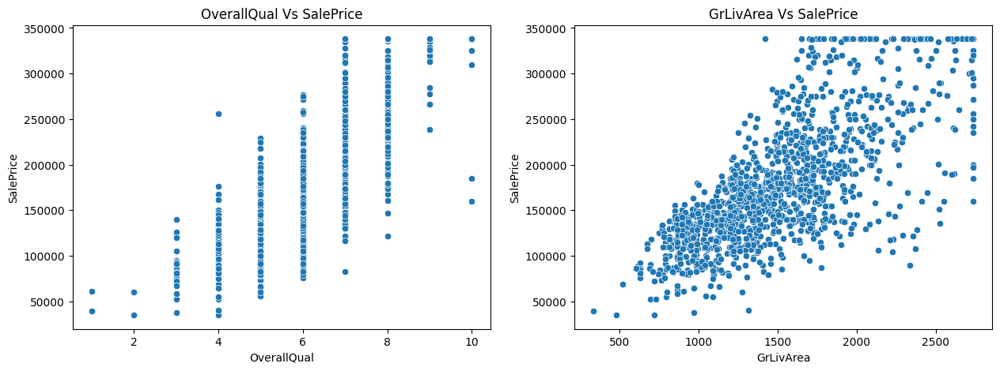

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(data, x='OverallQual', y='SalePrice', ax=ax[0])
ax[0].set_title('OverallQual Vs SalePrice');
sns.scatterplot(data, x='GrLivArea', y='SalePrice')
ax[1].set_title('GrLivArea Vs SalePrice');

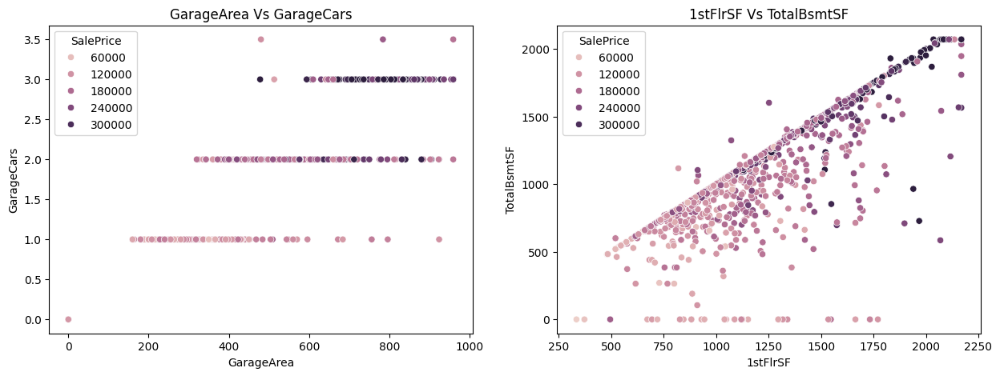

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(data, x='GarageArea', y='GarageCars', hue='SalePrice', ax=ax[0])
ax[0].set_title('GarageArea Vs GarageCars');
sns.scatterplot(data, x='1stFlrSF', y='TotalBsmtSF', hue='SalePrice')
ax[1].set_title('1stFlrSF Vs TotalBsmtSF');

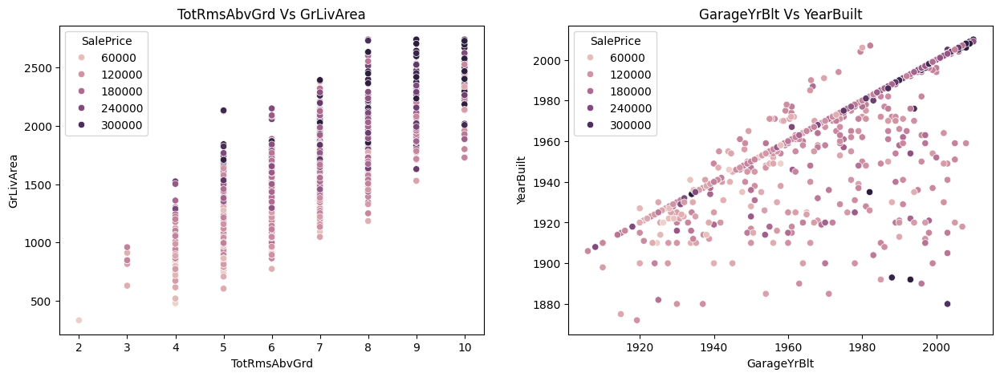

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(data, x='TotRmsAbvGrd', y='GrLivArea', hue='SalePrice', ax=ax[0])
ax[0].set_title('TotRmsAbvGrd Vs GrLivArea');
sns.scatterplot(data, x='GarageYrBlt', y='YearBuilt', hue='SalePrice')
ax[1].set_title('GarageYrBlt Vs YearBuilt');

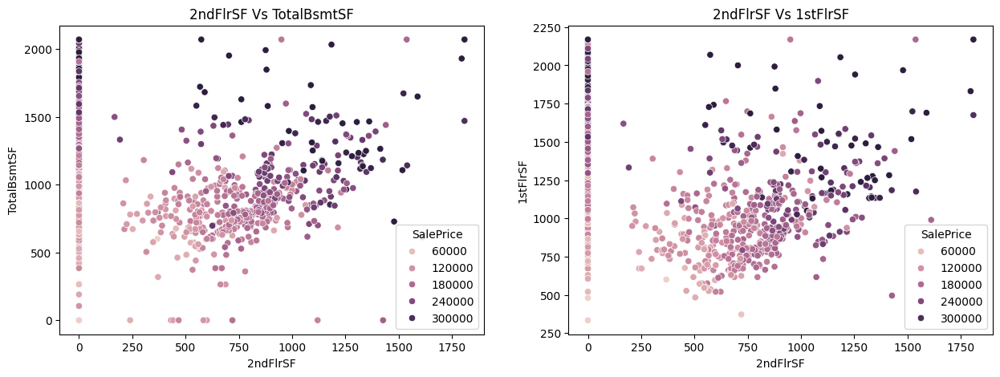

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(data, x='2ndFlrSF', y='TotalBsmtSF', hue='SalePrice', ax=ax[0])
ax[0].set_title('2ndFlrSF Vs TotalBsmtSF');
sns.scatterplot(data, x='2ndFlrSF', y='1stFlrSF', hue='SalePrice')
ax[1].set_title('2ndFlrSF Vs 1stFlrSF');

## Scaling the data using `MinMaxScaler`

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X_train_out)
X_train_norm = pd.DataFrame(scaler.transform(X_train_out), columns=X_train_out.columns, index=X_train_out.index)
X_val_norm = pd.DataFrame(scaler.transform(X_val_out), columns=X_val_out.columns, index=X_val_out.index)
test_df_norm = pd.DataFrame(scaler.transform(test_df_out), columns=test_df_out.columns, index=test_df_out.index)

## Scaling the data using `StandardScaler`

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train_out)
X_train_stand = pd.DataFrame(scaler.transform(X_train_out), columns=X_train_out.columns, index=X_train_out.index)
X_val_stand = pd.DataFrame(scaler.transform(X_val_out), columns=X_val_out.columns, index=X_val_out.index)
test_df_stand = pd.DataFrame(scaler.transform(test_df_out), columns=test_df_out.columns, index=test_df_out.index)

In [ ]:
X_train_norm.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,GarageYrBlt,...,Foundation,LotFrontage,OpenPorchSF,WoodDeckSF,2ndFlrSF,HalfBath,LotArea,CentralAir,PavedDrive,Electrical
1081,0.444444,0.293479,0.285714,0.321084,0.502294,0.384741,0.333333,0.375,0.659420,0.548077,...,0.285714,0.590164,0.000000,0.000000,0.000000,0.5,0.372837,1.0,1.0,1.0
837,0.555556,0.271447,0.285714,0.275215,0.233277,0.081199,0.333333,0.375,0.731884,0.644231,...,0.285714,0.000000,0.000000,0.000000,0.278549,0.5,0.012566,1.0,1.0,1.0
1450,0.444444,0.606080,0.000000,0.000000,0.432746,0.306267,0.666667,0.750,0.739130,0.527853,...,0.285714,0.426230,0.264706,0.076190,0.495199,1.0,0.465691,1.0,1.0,1.0
933,0.666667,0.484697,0.571429,0.594214,0.724463,0.635422,0.666667,0.500,0.956522,0.942308,...,0.571429,0.459016,0.211765,0.457143,0.000000,0.0,0.433935,1.0,1.0,1.0
1399,0.555556,0.529592,0.285714,0.225176,0.471384,0.450136,0.666667,0.625,0.384058,0.182692,...,0.000000,0.327869,0.094118,0.350000,0.247599,0.5,0.290569,1.0,1.0,1.0


In [ ]:
X_train_stand.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,GarageYrBlt,...,Foundation,LotFrontage,OpenPorchSF,WoodDeckSF,2ndFlrSF,HalfBath,LotArea,CentralAir,PavedDrive,Electrical
1081,-0.784046,-0.961489,-1.011971,-0.770319,-0.026655,-0.324241,-1.008410,-0.945824,-0.258053,-0.525022,...,-0.541222,0.256576,-0.805663,-0.786783,-0.788724,1.252708,-0.597194,0.267914,0.296719,0.310332
837,-0.065109,-1.072306,-1.011971,-0.981233,-1.403862,-1.841295,-1.008410,-0.945824,0.072629,-0.130873,...,-0.541222,-2.480895,-0.805663,-0.786783,0.376071,1.252708,-2.207399,0.267914,0.296719,0.310332
1450,-0.784046,0.610860,-2.355811,-2.246715,-0.382701,-0.716442,0.799299,0.999110,0.105698,-0.607923,...,-0.541222,-0.503832,0.056033,-0.513359,1.282022,3.250351,-0.182193,0.267914,0.296719,0.310332
933,0.653828,0.000320,0.331869,0.485575,1.110715,0.928623,0.799299,-0.297513,1.097746,1.090989,...,0.885389,-0.351751,-0.116306,0.853760,-0.788724,-0.744936,-0.324123,0.267914,0.296719,0.310332
1399,-0.065109,0.226136,-1.011971,-1.211320,-0.184898,0.002593,0.799299,0.350799,-1.514648,-2.022788,...,-1.967832,-0.960078,-0.499282,0.469258,0.246649,1.252708,-0.964885,0.267914,0.296719,0.310332


## Creating the models

### Model dependencies

In [ ]:
from sklearn.linear_model import (LinearRegression,
                                  SGDRegressor,
                                  ElasticNet,
                                  Lasso,
                                  TweedieRegressor,
                                  HuberRegressor)
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (GradientBoostingRegressor,
                              HistGradientBoostingRegressor,
                              RandomForestRegressor,
                              BaggingRegressor,
                              StackingRegressor)
from xgboost import XGBRegressor

from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
models = {
    'Linear': LinearRegression(),
    'SGD': SGDRegressor(random_state=8),
    'ElasticNet': ElasticNet(random_state=8),
    'Lasso': Lasso(random_state=8),
    'Tweedie': TweedieRegressor(),
    'Huber': HuberRegressor(),
    'DecisionTree': DecisionTreeRegressor(random_state=8),
    'GradientBoosting': GradientBoostingRegressor(random_state=8),
    'HistGradientBoosting': HistGradientBoostingRegressor(random_state=8),
    'XGB': XGBRegressor(),
    'RandomForest': RandomForestRegressor(random_state=8),
    'Bagging': BaggingRegressor(random_state=8),
}

### `cross_val_score` and accuracy scoring metrics on both train and test data with all the models.

In [ ]:
cvs = []
metrics = []

for name, model in models.items():
    score = cross_val_score(model, X_train_stand, y_train_out, n_jobs=-1, cv=5)
    cvs.append({
        'Model name': name,
        'CVS': score.mean(),
        })

    model.fit(X_train_stand, y_train_out)
    train_score = model.score(X_train_stand, y_train_out)
    val_score = model.score(X_val_stand, y_val_out)
    metrics.append({
        'Model name': name,
        'Train score': train_score,
        'Validation score': val_score,
        })

In [ ]:
cvs_df = pd.DataFrame(cvs)
cvs_df

,Model name,CVS
0,Linear,0.859760
1,SGD,0.858659
2,ElasticNet,0.846203
3,Lasso,0.859766
4,Tweedie,0.830426
5,Huber,0.860022
6,DecisionTree,0.741661
7,GradientBoosting,0.888080
8,HistGradientBoosting,0.882585
9,XGB,0.867028


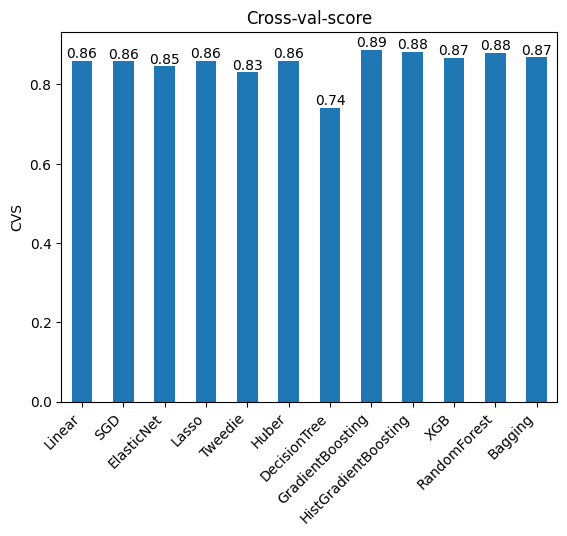

In [ ]:
ax = cvs_df.plot(kind='bar')
ax.set_xticklabels(cvs_df['Model name'].to_list(), rotation=45, ha='right')
ax.bar_label(ax.containers[0], fmt='%.2f')
ax.set_ylabel('CVS')
ax.set_title('Cross-val-score')
ax.get_legend().remove();

In [ ]:
metrics_df = pd.DataFrame(metrics)
metrics_df

,Model name,Train score,Validation score
0,Linear,0.868936,0.883971
1,SGD,0.867638,0.885674
2,ElasticNet,0.851176,0.863097
3,Lasso,0.868936,0.883979
4,Tweedie,0.834449,0.844922
5,Huber,0.866246,0.887641
6,DecisionTree,1.000000,0.743078
7,GradientBoosting,0.947074,0.906321
8,HistGradientBoosting,0.984598,0.909365
9,XGB,0.999656,0.896657


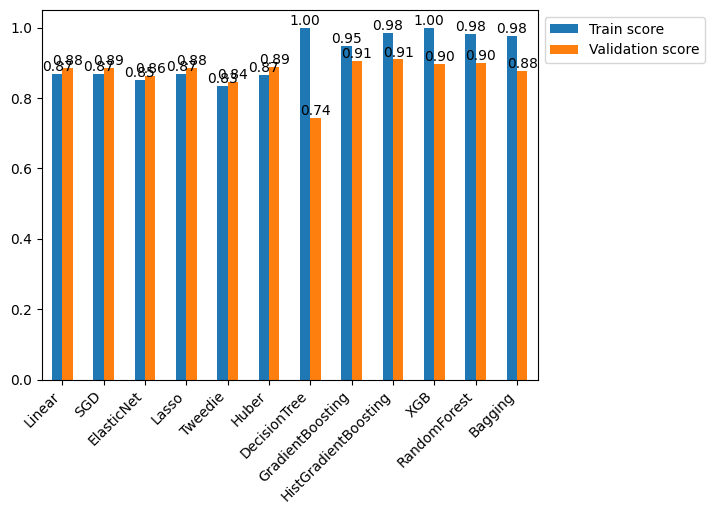

In [ ]:
ax = metrics_df.plot(kind='bar')
ax.set_xticklabels(metrics_df['Model name'].to_list(), rotation=45, ha='right')
ax.bar_label(ax.containers[0], fmt='%.2f')
ax.bar_label(ax.containers[1], fmt='%.2f')
ax.legend(bbox_to_anchor=(1, 1));

**About Data:**

> Apart from `DecisionTreeRegressor` all other models are performing well.

### Calculate `mean_absolute_error` and `mean_squared_error` for all the models.

In [ ]:
overall_results = []

def calculate_results(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    results = {
        'Model name': name,
        'MAE': mae,
        'RMSE': rmse,
    }

    overall_results.append(results)

    return pd.DataFrame(results, index=[0])

#### `GradientBoostingRegressor` model

In [ ]:
gbr = GradientBoostingRegressor(random_state=8)

gbr.fit(X_train_stand, y_train_out)
y_pred = gbr.predict(X_val_stand)

results = calculate_results('GradientBoosting', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,GradientBoosting,13874.749189,19206.586311


#### `GradientBoostingRegressor` model tuning

In [ ]:
gbr_tuned = GradientBoostingRegressor(random_state=8)

params = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': np.arange(100, 160, 20),
    'max_depth': [3, 5],
}

grid = GridSearchCV(gbr_tuned, params, n_jobs=-1, cv=5)
grid.fit(X_train_stand, y_train_out)

gbr_tuned = grid.best_estimator_
gbr_tuned.fit(X_train_stand, y_train_out)

GradientBoostingRegressor(n_estimators=120, random_state=8)

In [ ]:
y_pred = gbr_tuned.predict(X_val_stand)

results = calculate_results('GradientBoostingTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,GradientBoostingTuned,13706.192919,18977.607901


#### `HistGradientBoostingRegressor` model

In [ ]:
hgbr = HistGradientBoostingRegressor(random_state=8)

hgbr.fit(X_train_stand, y_train_out)
y_pred = hgbr.predict(X_val_stand)

results = calculate_results('HistGradientBoosting', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,HistGradientBoosting,13506.442733,18891.947628


#### `HistGradientBoostingRegressor` model tuning

In [ ]:
hgbr_tuned = HistGradientBoostingRegressor(random_state=8)

params = {
    'max_iter': [100, 120, 140],
    'max_depth': [None, 2, 4, 6],
}

grid = GridSearchCV(hgbr_tuned, params, n_jobs=-1, cv=5)
grid.fit(X_train_stand, y_train_out)

hgbr_tuned = grid.best_estimator_
hgbr_tuned.fit(X_train_stand, y_train_out)

HistGradientBoostingRegressor(max_depth=4, random_state=8)

In [ ]:
y_pred = hgbr_tuned.predict(X_val_stand)

results = calculate_results('HistGradientBoostingTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,HistGradientBoostingTuned,13796.714197,19208.279526


#### `XGBRegressor` model

In [ ]:
xgbr = XGBRegressor(random_state=8)

xgbr.fit(X_train_stand, y_train_out)
y_pred = xgbr.predict(X_val_stand)

results = calculate_results('XGB', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,XGB,14551.867696,20172.995867


#### `XGBRegressor` model tuning

In [ ]:
xgbr_tuned = XGBRegressor(random_state=8)

params = {
    'n_estimators': np.arange(100, 180, 20),
    'max_depth': [None, 2, 4, 6],
    'learning_rate': [0.08, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(xgbr_tuned, params, n_jobs=-1, cv=5)
grid.fit(X_train_stand, y_train_out)

xgbr_tuned = grid.best_estimator_
xgbr_tuned.fit(X_train_stand, y_train_out)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=160, n_jobs=None,
             num_parallel_tree=None, random_state=8, ...)

In [ ]:
y_pred = xgbr_tuned.predict(X_val_stand)

results = calculate_results('XGBTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,XGBTuned,13991.965914,19680.248987


#### `RandomForst` model

In [ ]:
rfr = RandomForestRegressor(random_state=8)

rfr.fit(X_train_stand, y_train_out)
y_pred = rfr.predict(X_val_stand)

results = calculate_results('RandomForest', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,RandomForest,14640.413613,19787.983635


#### `RandomForst` model tuning

In [ ]:
rfr_tuned = RandomForestRegressor(random_state=8)

params = {
    'criterion' : ["squared_error", "absolute_error"],
    'n_estimators': np.arange(120, 180, 20),
    'max_depth': [2, 4, 6, 8],
}

grid = GridSearchCV(rfr_tuned, params, n_jobs=-1, cv=5)
grid.fit(X_train_stand, y_train_out)

rfr_tuned = grid.best_estimator_
rfr_tuned.fit(X_train_stand, y_train_out)

RandomForestRegressor(criterion='absolute_error', max_depth=8, n_estimators=120,
                      random_state=8)

In [ ]:
y_pred = rfr_tuned.predict(X_val_stand)

results = calculate_results('RandomForestTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,RandomForestTuned,14526.437942,19905.192743


#### `Bagging` model

In [ ]:
bgr = BaggingRegressor(random_state=8)

bgr.fit(X_train_stand, y_train_out)
y_pred = bgr.predict(X_val_stand)

results = calculate_results('Bagging', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,Bagging,15886.8875,22028.264715


### Looking at the results

In [ ]:
results_df = pd.DataFrame(overall_results)
results_df

,Model name,MAE,RMSE
0,GradientBoosting,13874.749189,19206.586311
1,GradientBoostingTuned,13706.192919,18977.607901
2,HistGradientBoosting,13506.442733,18891.947628
3,HistGradientBoostingTuned,13796.714197,19208.279526
4,XGB,14551.867696,20172.995867
5,XGBTuned,13991.965914,19680.248987
6,RandomForest,14640.413613,19787.983635
7,RandomForestTuned,14526.437942,19905.192743
8,Bagging,15886.887500,22028.264715


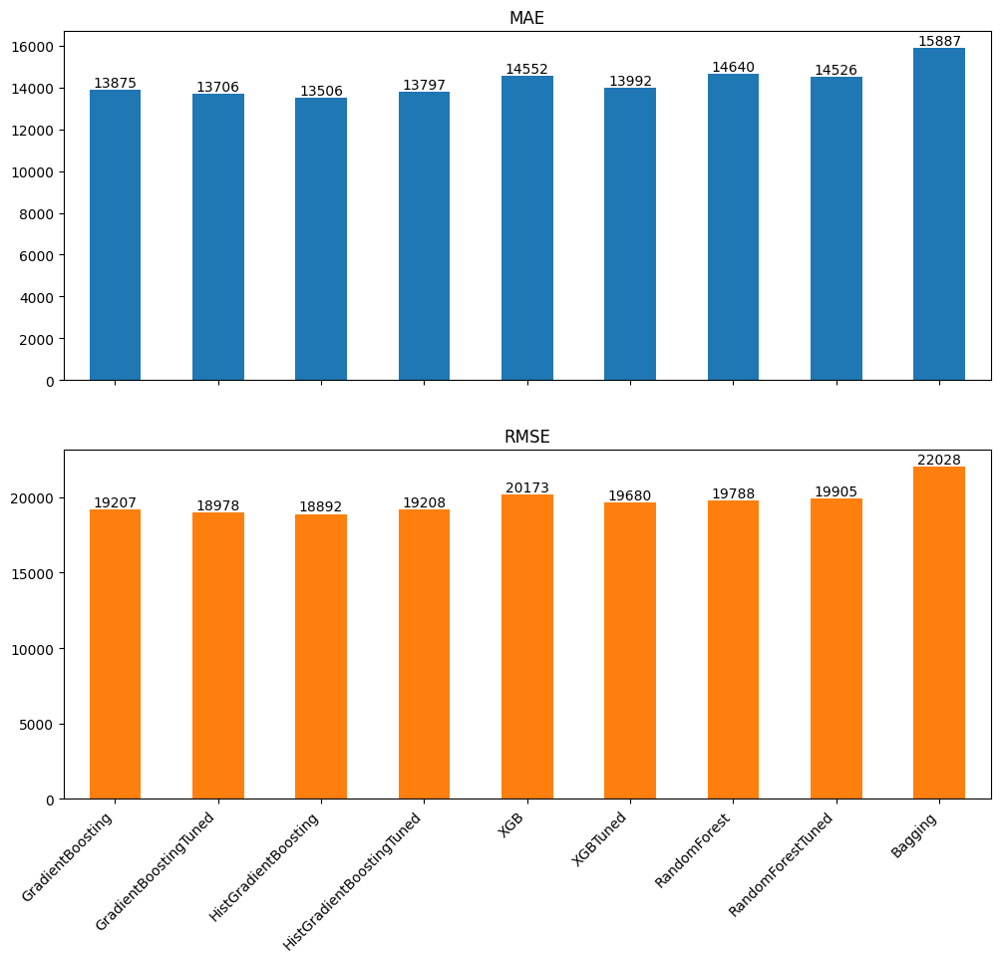

In [ ]:
ax = results_df.plot(kind='bar', subplots=True, figsize=(12, 10))
ax[0].bar_label(ax[0].containers[0], fmt='%.0f');
ax[0].get_legend().remove();
ax[1].bar_label(ax[1].containers[0], fmt='%.0f')
ax[1].get_legend().remove()
ax[1].set_xticklabels(results_df['Model name'].to_list(), rotation=45, ha='right');

#### `Bagging` with `GradientBoostingRegressor` model

In [ ]:
bg_gbr_untuned = BaggingRegressor(gbr, random_state=8)

bg_gbr_untuned.fit(X_train_stand, y_train_out)
y_pred = bg_gbr_untuned.predict(X_val_stand)

results = calculate_results('BaggingWithGradientBoosting', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,BaggingWithGradientBoosting,13201.11002,18404.278689


#### `Bagging` with `GradientBoostingRegressor` tuned model

In [ ]:
bg_gbr = BaggingRegressor(gbr_tuned, random_state=8)

bg_gbr.fit(X_train_stand, y_train_out)
y_pred = bg_gbr.predict(X_val_stand)

results = calculate_results('BaggingWithGradientBoostingTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,BaggingWithGradientBoostingTuned,13125.633202,18343.234599


#### `Bagging` with `HistGradientBoostingRegressor` model

In [ ]:
bg_hgbr = BaggingRegressor(hgbr, random_state=8)

bg_hgbr.fit(X_train_stand, y_train_out)
y_pred = bg_hgbr.predict(X_val_stand)

results = calculate_results('BaggingWithHistGradientBoosting', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,BaggingWithHistGradientBoosting,13387.92569,18774.178239


#### `Bagging` with `HistGradientBoostingRegressor` Tuned model

In [ ]:
bg_hgbr_tuned = BaggingRegressor(hgbr_tuned, random_state=8)

bg_hgbr_tuned.fit(X_train_stand, y_train_out)
y_pred = bg_hgbr_tuned.predict(X_val_stand)

results = calculate_results('BaggingWithHistGradientBoostingTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,BaggingWithHistGradientBoostingTuned,13628.927803,18984.831348


#### `Bagging` with `XGBRegressor` Tuned model

In [ ]:
bg_xgbr_tuned = BaggingRegressor(xgbr_tuned, random_state=8)

bg_xgbr_tuned.fit(X_train_stand, y_train_out)
y_pred = bg_xgbr_tuned.predict(X_val_stand)

results = calculate_results('BaggingWithXGBTuned', y_val_out, y_pred)
results

,Model name,MAE,RMSE
0,BaggingWithXGBTuned,13776.441353,19228.504366


### Looking at the results with Bagging

In [ ]:
results_bg = pd.DataFrame(overall_results)
results_bg

,Model name,MAE,RMSE
0,GradientBoosting,13874.749189,19206.586311
1,GradientBoostingTuned,13706.192919,18977.607901
2,HistGradientBoosting,13506.442733,18891.947628
3,HistGradientBoostingTuned,13796.714197,19208.279526
4,XGB,14551.867696,20172.995867
5,XGBTuned,13991.965914,19680.248987
6,RandomForest,14640.413613,19787.983635
7,RandomForestTuned,14526.437942,19905.192743
8,Bagging,15886.887500,22028.264715
9,BaggingWithGradientBoostingTuned,13125.633202,18343.234599


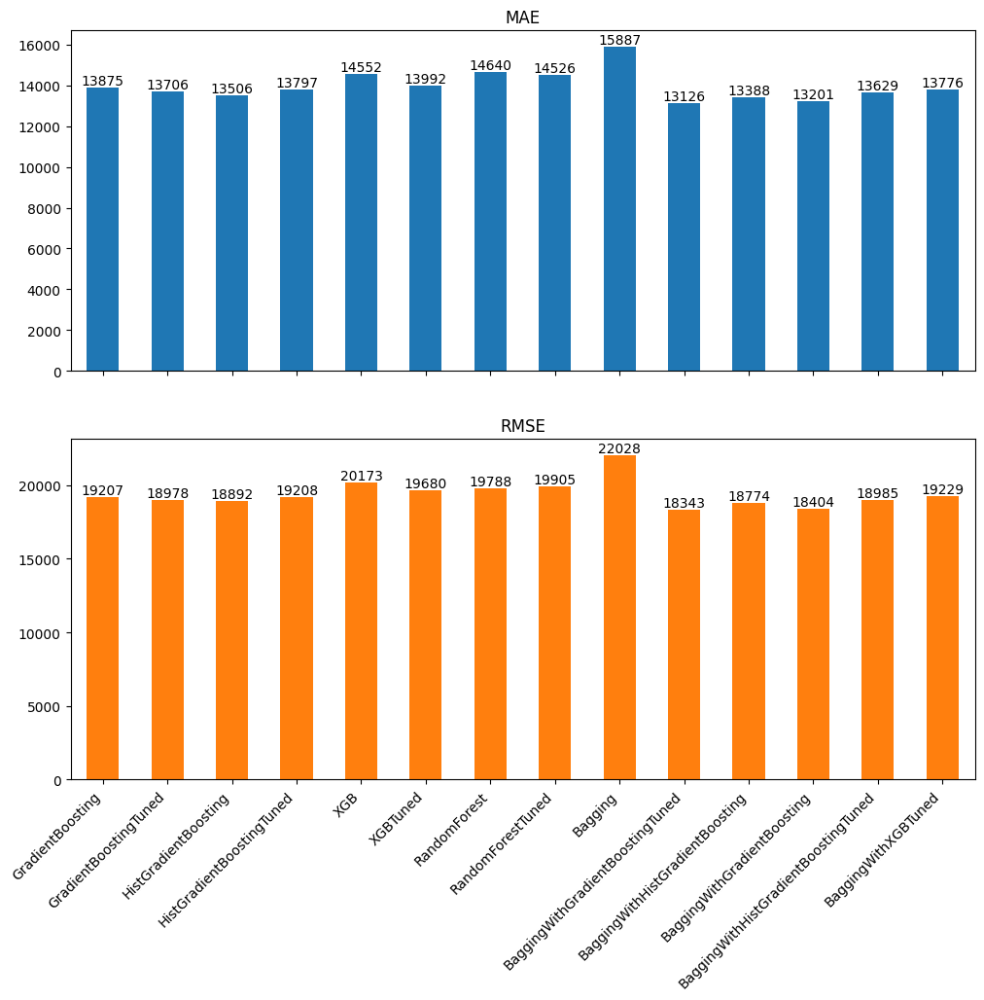

In [ ]:
ax = results_bg.plot(kind='bar', subplots=True, figsize=(12, 10))
ax[0].bar_label(ax[0].containers[0], fmt='%.0f');
ax[0].get_legend().remove();
ax[1].bar_label(ax[1].containers[0], fmt='%.0f')
ax[1].get_legend().remove()
ax[1].set_xticklabels(results_bg['Model name'].to_list(), rotation=45, ha='right');

### Stacking Regressor

In [ ]:
stacking_results = []

def stk_calculate_results(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    results = {
        'Model name': name,
        'MAE': mae,
        'RMSE': rmse,
    }

    stacking_results.append(results)

    return pd.DataFrame(results, index=[0])

#### Stacking model 1

In [ ]:
estimators = [
    ('GradientBoosting', bg_gbr_untuned)
]

final_estimator = bg_gbr

stk_clf1 = StackingRegressor(estimators, final_estimator=final_estimator, cv=5)
stk_clf1.fit(X_train_stand, y_train_out)

StackingRegressor(cv=5,
                  estimators=[('GradientBoosting',
                               BaggingRegressor(estimator=GradientBoostingRegressor(random_state=8),
                                                random_state=8))],
                  final_estimator=BaggingRegressor(estimator=GradientBoostingRegressor(n_estimators=120,
                                                                                       random_state=8),
                                                   random_state=8))

In [ ]:
y_pred = stk_clf1.predict(X_val_stand)

stk_calculate_results('StackingRegressor1', y_val_out, y_pred)

,Model name,MAE,RMSE
0,StackingRegressor1,13909.978347,19596.13731


#### Stacking model 2

In [ ]:
estimators = [
    ('HistGradientBoosting', hgbr),
    ('BgHistGradientBoosting', bg_hgbr),
    ('BgGradientBoosting', bg_gbr_untuned)
]

final_estimator = bg_gbr

stk_clf2 = StackingRegressor(estimators, final_estimator=final_estimator, cv=5)
stk_clf2.fit(X_train_stand, y_train_out)

StackingRegressor(cv=5,
                  estimators=[('HistGradientBoosting',
                               HistGradientBoostingRegressor(random_state=8)),
                              ('BgHistGradientBoosting',
                               BaggingRegressor(estimator=HistGradientBoostingRegressor(random_state=8),
                                                random_state=8)),
                              ('BgGradientBoosting',
                               BaggingRegressor(estimator=GradientBoostingRegressor(random_state=8),
                                                random_state=8))],
                  final_estimator=BaggingRegressor(estimator=GradientBoostingRegressor(n_estimators=120,
                                                                                       random_state=8),
                                                   random_state=8))

In [ ]:
y_pred = stk_clf2.predict(X_val_stand)

stk_calculate_results('StackingRegressor2', y_val_out, y_pred)

,Model name,MAE,RMSE
0,StackingRegressor2,13502.197567,19212.363794


#### Stacking model 3

In [ ]:
estimators = [
    ('HistGradientBoosting', hgbr),
    ('BgHistGradientBoosting', bg_hgbr),
    ('BgGradientBoosting', bg_gbr_untuned),
    ('BgHistGradientBoostingTuned', bg_hgbr_tuned)
]

final_estimator = bg_gbr

stk_clf3 = StackingRegressor(estimators, final_estimator=final_estimator, cv=5)
stk_clf3.fit(X_train_stand, y_train_out)

StackingRegressor(cv=5,
                  estimators=[('HistGradientBoosting',
                               HistGradientBoostingRegressor(random_state=8)),
                              ('BgHistGradientBoosting',
                               BaggingRegressor(estimator=HistGradientBoostingRegressor(random_state=8),
                                                random_state=8)),
                              ('BgGradientBoosting',
                               BaggingRegressor(estimator=GradientBoostingRegressor(random_state=8),
                                                random_state=8)),
                              ('BgHistGradientBoostingTuned',
                               BaggingRegressor(estimator=HistGradientBoostingRegressor(max_depth=4,
                                                                                        random_state=8),
                                                random_state=8))],
                  final_estimator=BaggingRegressor(estimator=GradientBoostingRegressor(n_estimators=120,
                                                                                       random_state=8),
                                                   random_state=8))

In [ ]:
y_pred = stk_clf3.predict(X_val_stand)

stk_calculate_results('StackingRegressor2', y_val_out, y_pred)

,Model name,MAE,RMSE
0,StackingRegressor2,13552.572299,18982.5507


### Results of Stacking Regressor

In [ ]:
stack_df = pd.DataFrame(stacking_results)
stack_df

,Model name,MAE,RMSE
0,StackingRegressor1,13909.978347,19596.137310
1,StackingRegressor2,13502.197567,19212.363794
2,StackingRegressor2,13552.572299,18982.550700


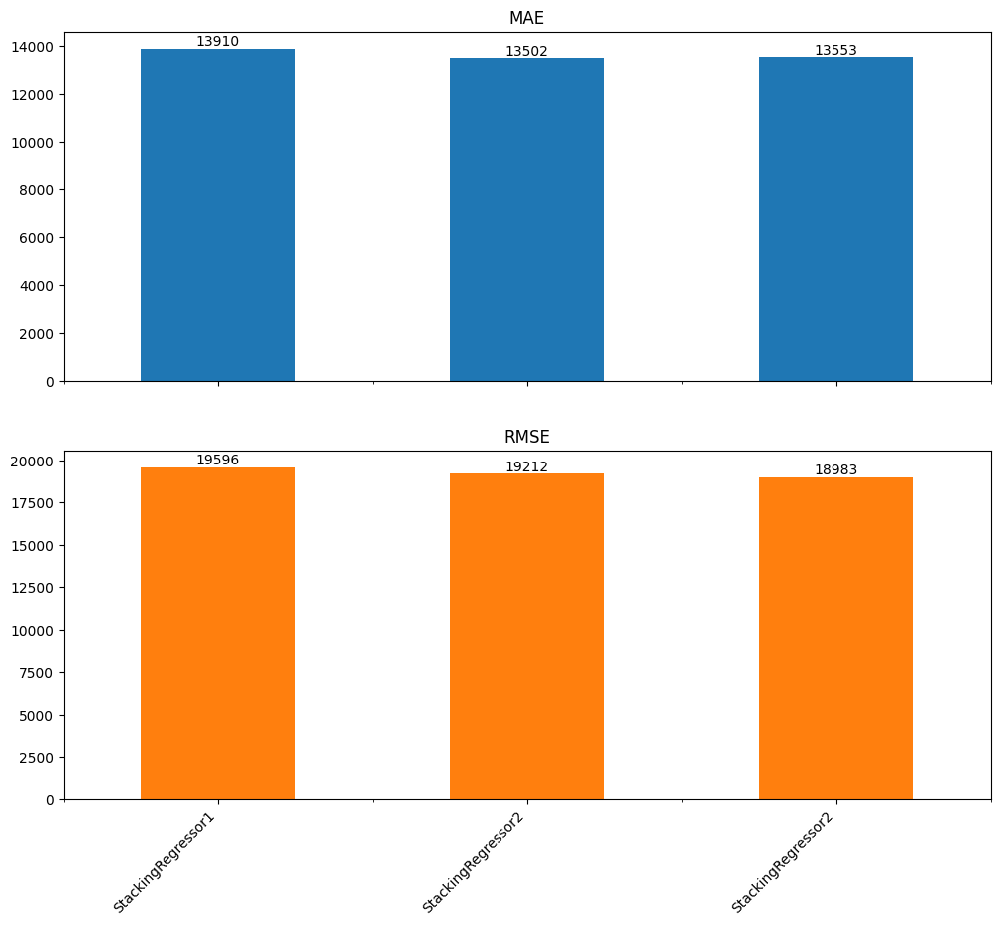

In [ ]:
ax = stack_df.plot(kind='bar', subplots=True, figsize=(12, 10))
ax[0].bar_label(ax[0].containers[0], fmt='%.0f');
ax[0].get_legend().remove();
ax[1].bar_label(ax[1].containers[0], fmt='%.0f')
ax[1].get_legend().remove()
ax[1].set_xticklabels(stack_df['Model name'].to_list(), rotation=45, ha='right');

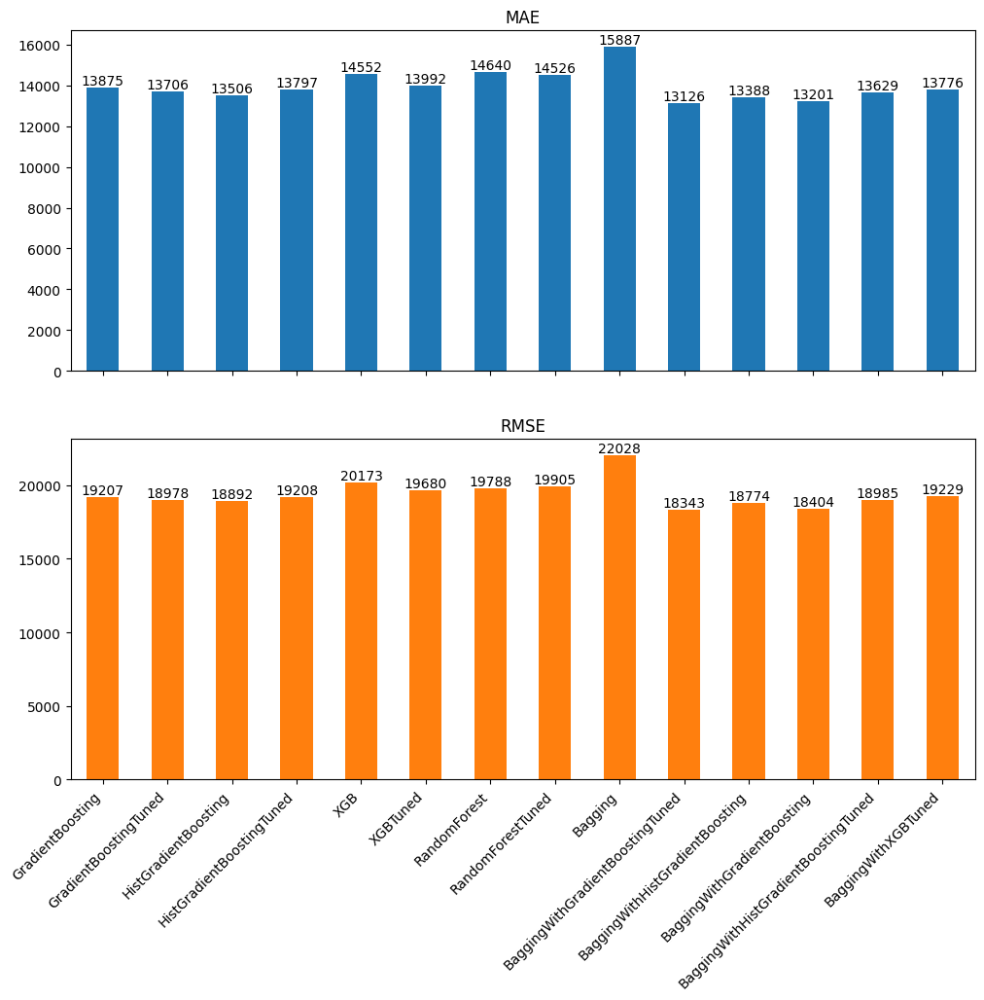

In [ ]:
ax = results_bg.plot(kind='bar', subplots=True, figsize=(12, 10))
ax[0].bar_label(ax[0].containers[0], fmt='%.0f');
ax[0].get_legend().remove();
ax[1].bar_label(ax[1].containers[0], fmt='%.0f')
ax[1].get_legend().remove()
ax[1].set_xticklabels(results_bg['Model name'].to_list(), rotation=45, ha='right');

**About Data:**

> It is found that best model is `BaggingRegressor` with `GradientBoostingRegressor` tuned.

## Saving the model

In [ ]:
import joblib

filepath = '/content/drive/MyDrive/Colab Notebooks/Machine Learning Projects/RegressionProjects/1. HousePricePrediction/'
joblib.dump(bg_gbr, filepath + 'model_bg_gbr_tuned.joblib')

['/content/drive/MyDrive/Colab Notebooks/Machine Learning Projects/RegressionProjects/1. HousePricePrediction/model_bg_gbr_tuned.joblib']

## Loading the saved model

In [ ]:
filename = '/content/drive/MyDrive/Colab Notebooks/Machine Learning Projects/RegressionProjects/1. HousePricePrediction/model_bg_gbr_tuned.joblib'

saved_model = joblib.load(filename)

In [ ]:
saved_model.score(X_val_stand, y_val_out), bg_gbr.score(X_val_stand, y_val_out)

(0.9145537580773239, 0.9145537580773239)

In [ ]:
y_pred = saved_model.predict(X_val_stand)

calculate_results('Test', y_val_out, y_pred)

,Model name,MAE,RMSE
0,Test,13125.633202,18343.234599


## Submission prediction with test_data

In [ ]:
y_pred = saved_model.predict(test_df_stand)
y_pred

array([124826.38086731, 160797.97261358, 189464.62561477, ...,
       181041.85764285, 115250.0414818 , 244512.82365172])

In [ ]:
test_data.head(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal


In [ ]:
submission_df = pd.DataFrame({
    'Id': test_data['Id'].values,
    'SalePrice': y_pred,
})

submission_df.head()

,Id,SalePrice
0,1461,124826.380867
1,1462,160797.972614
2,1463,189464.625615
3,1464,185987.315057
4,1465,195587.382566


In [ ]:
submission_df.to_csv('House-price-submission.csv', index=False)

---

---

In [ ]:
!pip install tensorflow_decision_forests

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 41.8 MB/s eta 0:00:00


In [ ]:
import tensorflow_decision_forests as tfdf

In [ ]:
pd.concat([X_train_stand, y_train_out], axis=1).rename(columns={0: 'SalePrice'})

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,GarageYrBlt,...,LotFrontage,OpenPorchSF,WoodDeckSF,2ndFlrSF,HalfBath,LotArea,CentralAir,PavedDrive,Electrical,SalePrice
1081,-0.784046,-0.961489,-1.011971,-0.770319,-0.026655,-0.324241,-1.008410,-0.945824,-0.258053,-0.525022,...,0.256576,-0.805663,-0.786783,-0.788724,1.252708,-0.597194,0.267914,0.296719,0.310332,133000.0
837,-0.065109,-1.072306,-1.011971,-0.981233,-1.403862,-1.841295,-1.008410,-0.945824,0.072629,-0.130873,...,-2.480895,-0.805663,-0.786783,0.376071,1.252708,-2.207399,0.267914,0.296719,0.310332,100000.0
1450,-0.784046,0.610860,-2.355811,-2.246715,-0.382701,-0.716442,0.799299,0.999110,0.105698,-0.607923,...,-0.503832,0.056033,-0.513359,1.282022,3.250351,-0.182193,0.267914,0.296719,0.310332,136000.0
933,0.653828,0.000320,0.331869,0.485575,1.110715,0.928623,0.799299,-0.297513,1.097746,1.090989,...,-0.351751,-0.116306,0.853760,-0.788724,-0.744936,-0.324123,0.267914,0.296719,0.310332,190000.0
1399,-0.065109,0.226136,-1.011971,-1.211320,-0.184898,0.002593,0.799299,0.350799,-1.514648,-2.022788,...,-0.960078,-0.499282,0.469258,0.246649,1.252708,-0.964885,0.267914,0.296719,0.310332,137450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
986,-0.065109,0.282590,-1.011971,-1.024374,-1.398917,-0.430462,-1.008410,-0.945824,-2.010673,-1.037415,...,-0.554526,-0.805663,2.579748,0.676514,-0.744936,-1.203096,0.267914,0.296719,0.310332,117000.0
133,1.372765,-0.426221,0.331869,0.011020,0.534612,0.373005,0.799299,-0.297513,0.998541,0.972744,...,-0.111675,-0.326943,0.853760,-0.788724,-0.744936,-0.776198,0.267914,0.296719,0.310332,220000.0
361,-0.784046,0.010774,-1.011971,-1.096277,-0.414845,-0.465869,-1.008410,0.999110,-1.018624,-1.431564,...,-0.468428,-0.805663,-0.786783,0.406115,-0.744936,-0.142353,0.267914,-3.661539,0.310332,145000.0
1364,0.653828,-0.626947,0.331869,0.054161,-1.114574,-1.740521,0.799299,-1.594136,1.130815,1.130404,...,-2.024650,2.373037,-0.786783,0.597936,1.252708,-1.792398,0.267914,0.296719,0.310332,144152.0


In [ ]:
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(pd.concat([X_train_stand, y_train_out], axis=1).rename(columns={0: 'SalePrice'}),
                                                 label='SalePrice',
                                                 task=tfdf.keras.Task.REGRESSION,
                                                 batch_size=64)
val_ds = tfdf.keras.pd_dataframe_to_tf_dataset(pd.concat([X_val_stand, y_val_out], axis=1).rename(columns={0: 'SalePrice'}),
                                               label='SalePrice',
                                               task=tfdf.keras.Task.REGRESSION,
                                               batch_size=64)

In [ ]:
model = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.REGRESSION)
model.fit(train_ds,
          validation_data=val_ds)

Use /tmp/tmpnfyxqun9 as temporary training directory
Reading training dataset...


Training dataset read in 0:00:00.437529. Found 1314 examples.
Reading validation dataset...
Num validation examples: tf.Tensor(146, shape=(), dtype=int32)
Validation dataset read in 0:00:00.414543. Found 146 examples.
Training model...
Model trained in 0:00:01.960444
Compiling model...
Model compiled.


In [ ]:
model.compile(metrics=['mse'])

evaluation = model.evaluate(val_ds, return_dict=True)
evaluation

1/1 [==============================] - 1s 627ms/step - loss: 0.0000e+00 - mse: 382163712.0000


{'loss': 0.0, 'mse': 382163712.0}

In [ ]:
np.sqrt(evaluation['mse'])

19549.00795436945

In [ ]:
model1 = tfdf.keras.GradientBoostedTreesModel(task=tfdf.keras.Task.REGRESSION)
model1.fit(train_ds)
model1.compile(metrics=['mse'])

evaluation1 = model1.evaluate(val_ds, return_dict=True)
evaluation1

Use /tmp/tmpu32svrog as temporary training directory
Reading training dataset...
Training dataset read in 0:00:00.847965. Found 1314 examples.
Training model...
Model trained in 0:00:01.920858
Compiling model...
Model compiled.
1/1 [==============================] - 1s 572ms/step - loss: 0.0000e+00 - mse: 377754144.0000


{'loss': 0.0, 'mse': 377754144.0}

In [ ]:
np.sqrt(evaluation1['mse'])

19435.898332724424

In [ ]:
train_ds

<_PrefetchDataset element_spec=({'OverallQual': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'GrLivArea': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'GarageCars': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'GarageArea': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'TotalBsmtSF': TensorSpec(shape=(None,), dtype=tf.float64, name=None), '1stFlrSF': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'FullBath': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'TotRmsAbvGrd': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'YearBuilt': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'GarageYrBlt': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'YearRemodAdd': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'MasVnrArea': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'Fireplaces': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'BsmtFinSF1': TensorSpec(shape=(None,), dtype=tf.float64

In [ ]:
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import layers
from tensorflow import keras
import tensorflow as tf

In [ ]:
neural_model = keras.models.Sequential([
    layers.Input(shape=(24, )),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1)
])


neural_model.compile(optimizer=keras.optimizers.Adam(),
                     loss=keras.losses.mse,
                     metrics=['mae'])

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train_stand, y_train_out)).batch(64).prefetch(tf.data.AUTOTUNE)
val_dataset = tf.data.Dataset.from_tensor_slices((X_val_stand, y_val_out)).batch(64).prefetch(tf.data.AUTOTUNE)

In [ ]:
history = neural_model.fit(train_dataset,
                           epochs=100,
                           validation_data=val_dataset,
                           callbacks=[keras.callbacks.ModelCheckpoint(filepath='Modelcheckpoint/temp/1/best',
                                                                      monitor='val_mae',
                                                                      save_best_only=True,
                                                                      save_weights_only=True)])

Epoch 1/100
21/21 [==============================] - 0s 4ms/step - loss: 353664096.0000 - mae: 13392.7822 - val_loss: 408551712.0000 - val_mae: 15017.6748
Epoch 2/100
21/21 [==============================] - 0s 3ms/step - loss: 353193216.0000 - mae: 13385.6191 - val_loss: 408327232.0000 - val_mae: 15026.5547
Epoch 3/100
21/21 [==============================] - 0s 5ms/step - loss: 352822336.0000 - mae: 13380.0117 - val_loss: 408320064.0000 - val_mae: 15016.3018
Epoch 4/100
21/21 [==============================] - 0s 3ms/step - loss: 352343008.0000 - mae: 13370.5967 - val_loss: 408426944.0000 - val_mae: 15017.4277
Epoch 5/100
21/21 [==============================] - 0s 4ms/step - loss: 351953888.0000 - mae: 13362.8291 - val_loss: 408345536.0000 - val_mae: 15021.3750
Epoch 6/100
21/21 [==============================] - 0s 3ms/step - loss: 351505120.0000 - mae: 13356.4854 - val_loss: 408501056.0000 - val_mae: 15021.3164
Epoch 7/100
21/21 [==============================] - 0s 3ms/step - los

In [ ]:
train_dataset, val_dataset

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 24), dtype=tf.float64, name=None), TensorSpec(shape=(None,), dtype=tf.float64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 24), dtype=tf.float64, name=None), TensorSpec(shape=(None,), dtype=tf.float64, name=None))>)

In [ ]:
checkpointpath = '/content/Modelcheckpoint/temp/1/best'

neural_model.load_weights(checkpointpath)

In [ ]:
ans = neural_model.evaluate(val_dataset)

3/3 [==============================] - 0s 7ms/step - loss: 402670368.0000 - mae: 14852.0049


In [ ]:
np.sqrt(ans[1])

121.86880192572872

In [ ]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_df_stand).batch(64).prefetch(tf.data.AUTOTUNE)

test_dataset

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 24), dtype=tf.float64, name=None)>

In [ ]:
y_pred = neural_model.predict(test_dataset)

y_pred[:10]

23/23 [==============================] - 0s 4ms/step


array([[125913.34],
       [166162.53],
       [192205.88],
       [199052.14],
       [181885.36],
       [176228.39],
       [198483.83],
       [154806.89],
       [195538.44],
       [124832.7 ]], dtype=float32)

In [111]:
y_pred = y_pred.squeeze()

In [112]:
y_pred

array([125913.34, 166162.53, 192205.88, ..., 215272.47, 118547.27,
       233654.45], dtype=float32)

In [113]:
submission_df = pd.DataFrame({
    'Id': test_data['Id'].values,
    'SalePrice': y_pred,
})

submission_df.head()

,Id,SalePrice
0,1461,125913.343750
1,1462,166162.531250
2,1463,192205.875000
3,1464,199052.140625
4,1465,181885.359375


In [114]:
submission_df.to_csv('House-price-submission1.csv', index=False)